In [7]:
import matplotlib.pyplot as plt
import os
import cv2
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.preprocessing import label_binarize
import tensorflow as tf
%matplotlib inline

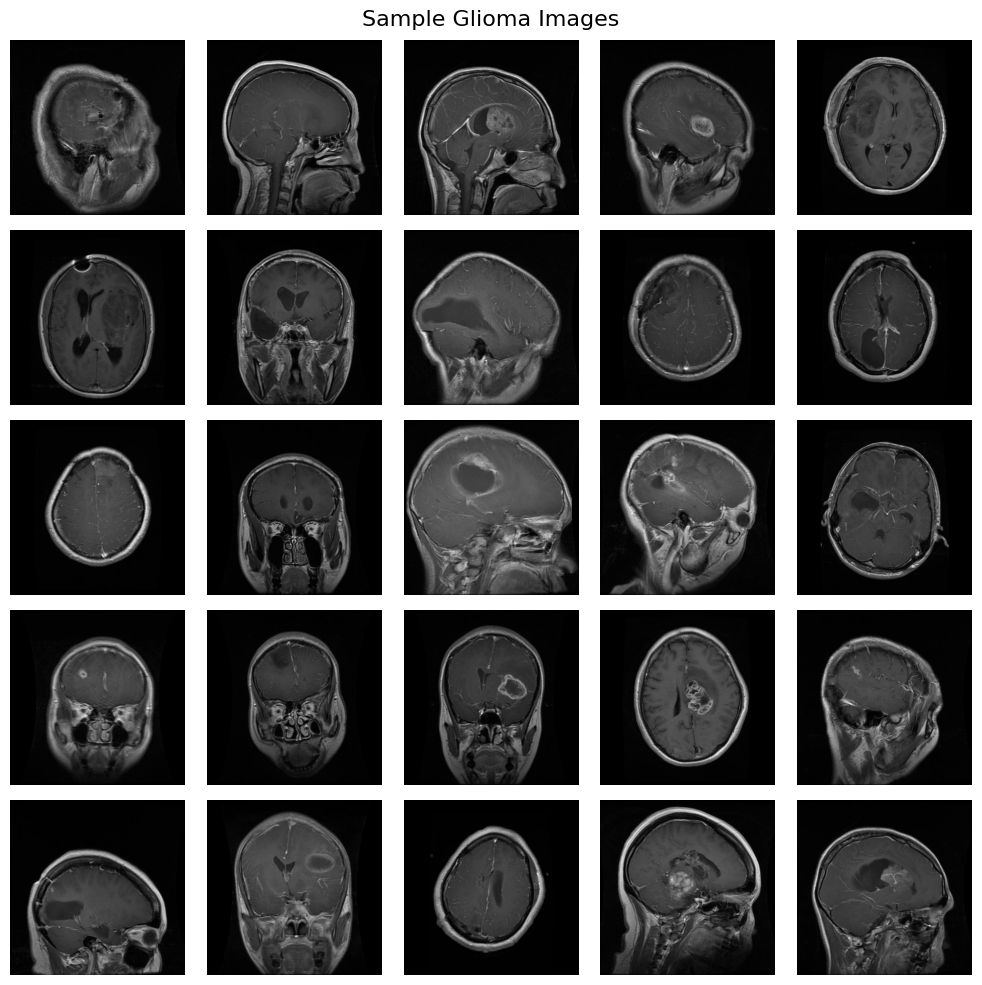

In [8]:
glioma="/kaggle/input/brain-tumor-mri-dataset/Training/glioma/"
image_files = os.listdir(glioma)

plt.figure(figsize=(10, 10))

for i in range(25):
    img_path = os.path.join(glioma, image_files[i])
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(5, 5, i + 1)
    plt.imshow(img)
    plt.axis('off')

plt.suptitle('Sample Glioma Images', fontsize=16)
plt.tight_layout()
plt.show()

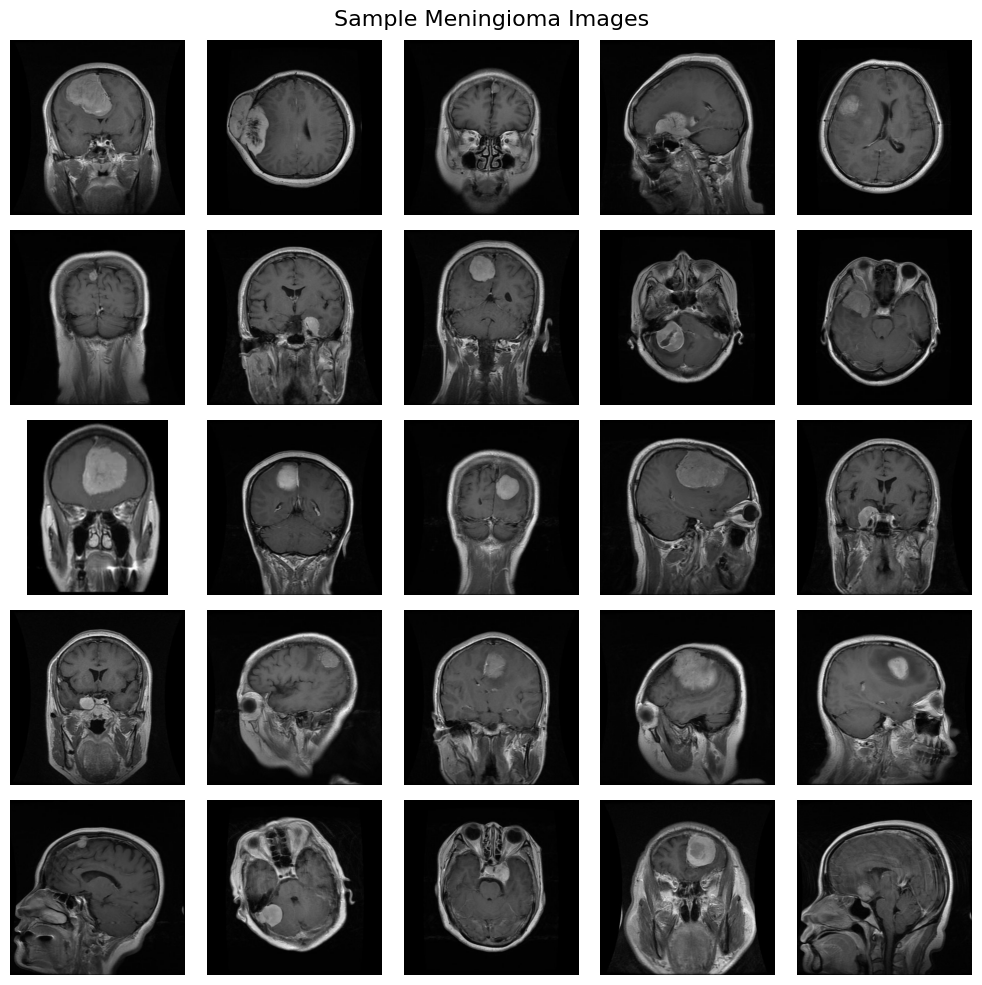

In [9]:
meningioma_dir="/kaggle/input/brain-tumor-mri-dataset/Training/meningioma/"
image_files = os.listdir(meningioma_dir)

plt.figure(figsize=(10, 10))

for i in range(25):
    img_path = os.path.join(meningioma_dir, image_files[i])
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(5, 5, i + 1)
    plt.imshow(img)
    plt.axis('off')

plt.suptitle('Sample Meningioma Images', fontsize=16)
plt.tight_layout()
plt.show()

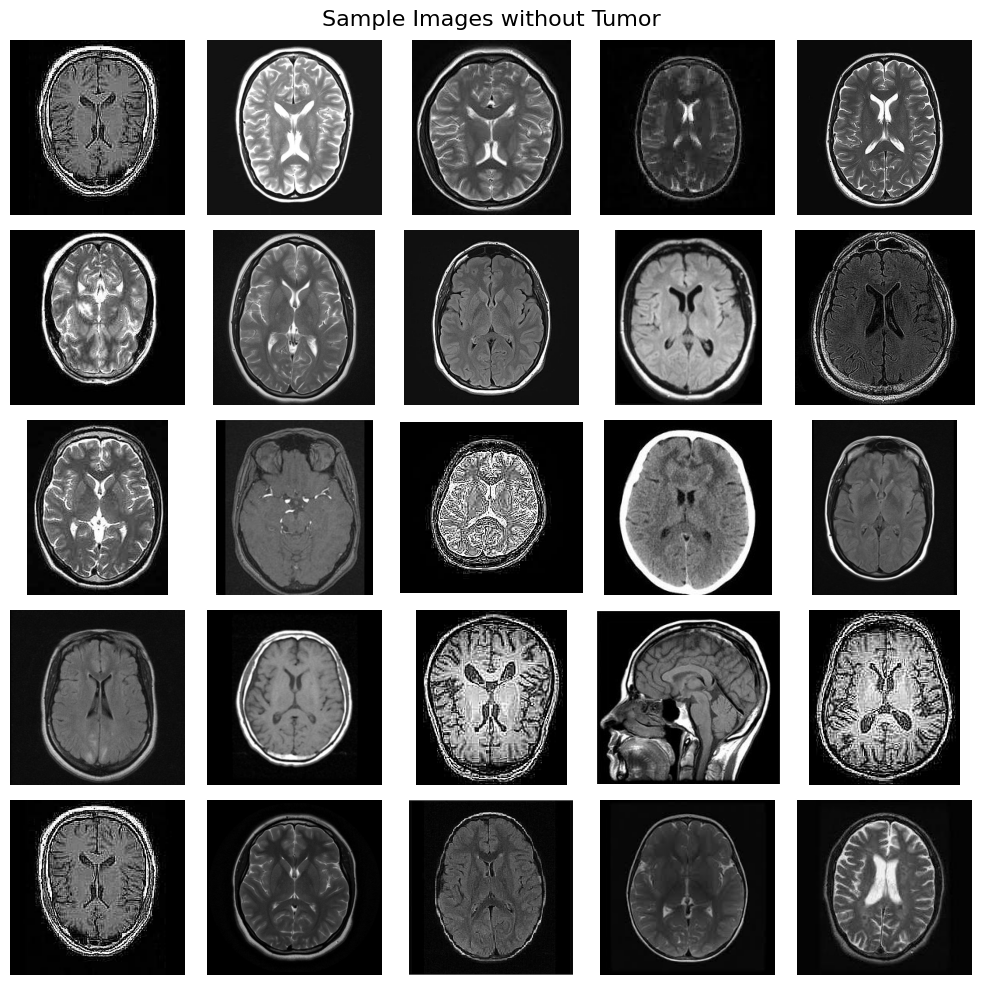

In [10]:
notumor_dir="/kaggle/input/brain-tumor-mri-dataset/Training/notumor/"
image_files = os.listdir(notumor_dir)

plt.figure(figsize=(10, 10))

for i in range(25):
    img_path = os.path.join(notumor_dir, image_files[i])
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(5, 5, i + 1)
    plt.imshow(img)
    plt.axis('off')

plt.suptitle('Sample Images without Tumor', fontsize=16)
plt.tight_layout()
plt.show()

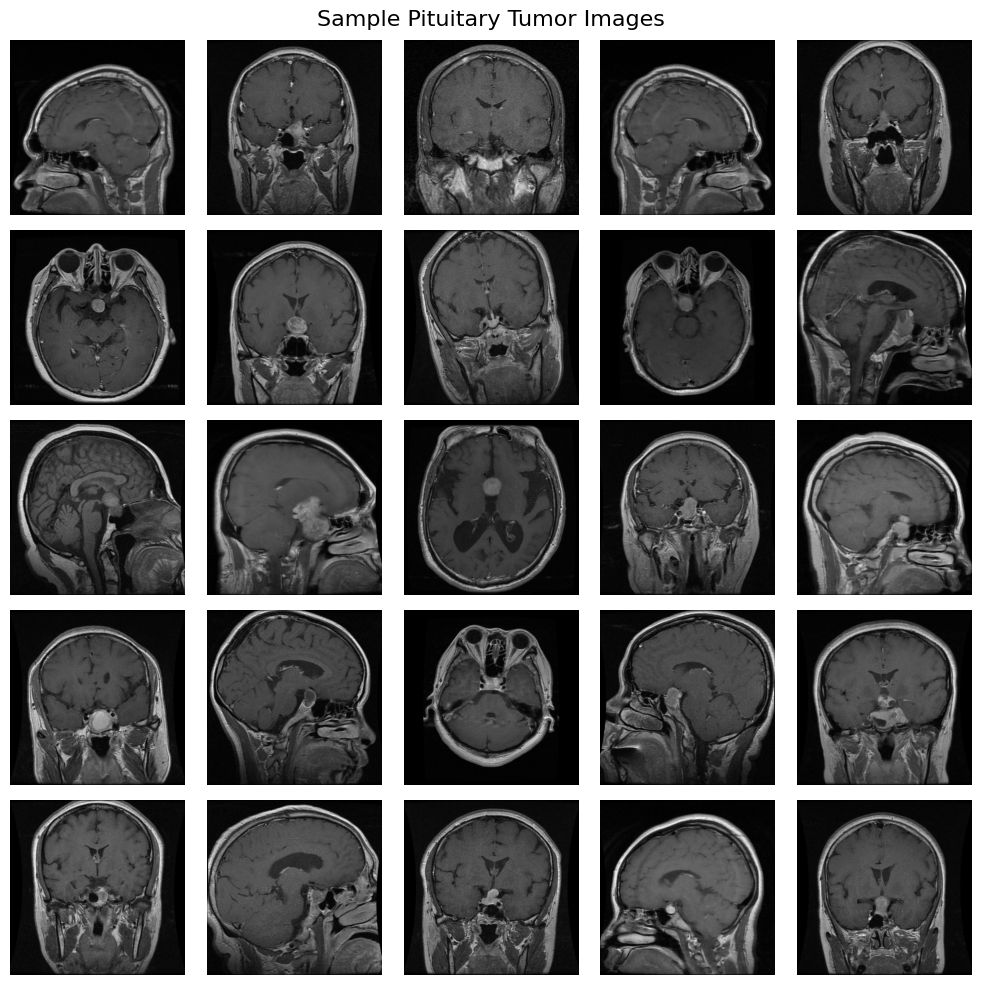

In [11]:
pituitary_dir="/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/"
image_files = os.listdir(pituitary_dir)

plt.figure(figsize=(10, 10))

for i in range(25):
    img_path = os.path.join(pituitary_dir, image_files[i])
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(5, 5, i + 1)
    plt.imshow(img)
    plt.axis('off')

plt.suptitle('Sample Pituitary Tumor Images', fontsize=16)
plt.tight_layout()
plt.show()


In [12]:
image_size=[150,150]
train_data="/kaggle/input/brain-tumor-mri-dataset/Training/"
test_data="/kaggle/input/brain-tumor-mri-dataset/Testing/"
valid_data="/kaggle/input/brain-tumor-mri-dataset/Testing/"

In [13]:
filepath=[]
label=[]
image_folder=os.listdir(train_data)
for folder in image_folder:
    folder_path=os.path.join(train_data,folder)
    filelist=os.listdir(folder_path)
    for file in filelist:
        new_path=os.path.join(folder_path,file)
        filepath.append(new_path)
        label.append(folder)
        

image_data=pd.Series(filepath,name="image_data")
label_data=pd.Series(label,name="label")
train_df=pd.concat([image_data,label_data],axis=1)
train_df.head()
        

,image_data,label
0,/kaggle/input/brain-tumor-mri-dataset/Training...,pituitary
1,/kaggle/input/brain-tumor-mri-dataset/Training...,pituitary
2,/kaggle/input/brain-tumor-mri-dataset/Training...,pituitary
3,/kaggle/input/brain-tumor-mri-dataset/Training...,pituitary
4,/kaggle/input/brain-tumor-mri-dataset/Training...,pituitary


In [14]:
train_df.shape

(5712, 2)

In [15]:
train_df.isnull().sum()

image_data    0
label         0
dtype: int64

In [16]:
train_df["label"].value_counts()

label
notumor       1595
pituitary     1457
meningioma    1339
glioma        1321
Name: count, dtype: int64

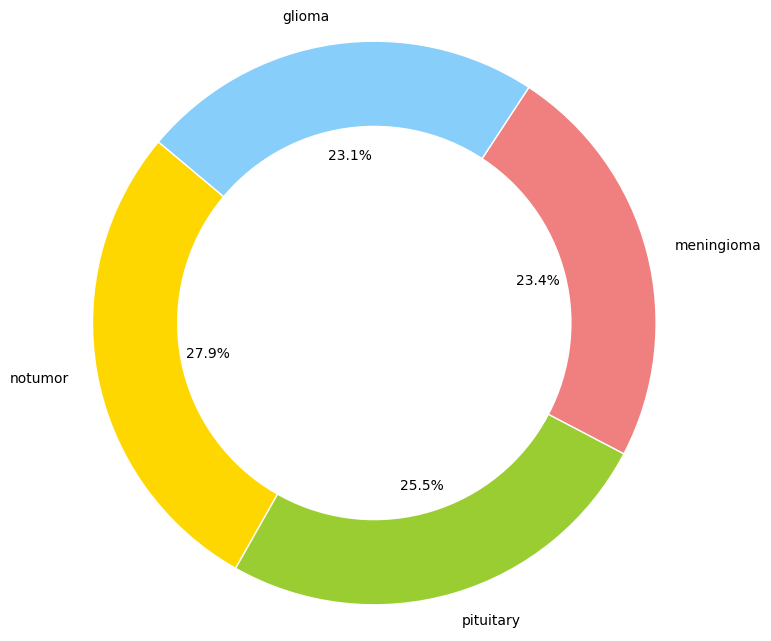

In [17]:
labels = train_df["label"].value_counts().index
sizes = train_df["label"].value_counts().values
colors = ['gold', 'yellowgreen', 'lightcoral', 'lightskyblue']

fig, ax = plt.subplots(figsize=(8, 8))

wedges, texts, autotexts = ax.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%',
                                  startangle=140, wedgeprops={'edgecolor': 'white'})

centre_circle = plt.Circle((0,0), 0.70, fc='white')
fig.gca().add_artist(centre_circle)

ax.axis('equal')  

plt.show()

In [18]:
filepath=[]
label=[]
image_folder=os.listdir(test_data)
for folder in image_folder:
    folder_path=os.path.join(test_data,folder)
    filelist=os.listdir(folder_path)
    for file in filelist:
        new_path=os.path.join(folder_path,file)
        filepath.append(new_path)
        label.append(folder)
        

image_data=pd.Series(filepath,name="image_data")
label_data=pd.Series(label,name="label")
test_df=pd.concat([image_data,label_data],axis=1)
test_df.head()
        

,image_data,label
0,/kaggle/input/brain-tumor-mri-dataset/Testing/...,pituitary
1,/kaggle/input/brain-tumor-mri-dataset/Testing/...,pituitary
2,/kaggle/input/brain-tumor-mri-dataset/Testing/...,pituitary
3,/kaggle/input/brain-tumor-mri-dataset/Testing/...,pituitary
4,/kaggle/input/brain-tumor-mri-dataset/Testing/...,pituitary


In [19]:
test_df.shape

(1311, 2)

In [20]:
test_df.isnull().sum()

image_data    0
label         0
dtype: int64

In [21]:
test_df["label"].value_counts()

label
notumor       405
meningioma    306
pituitary     300
glioma        300
Name: count, dtype: int64

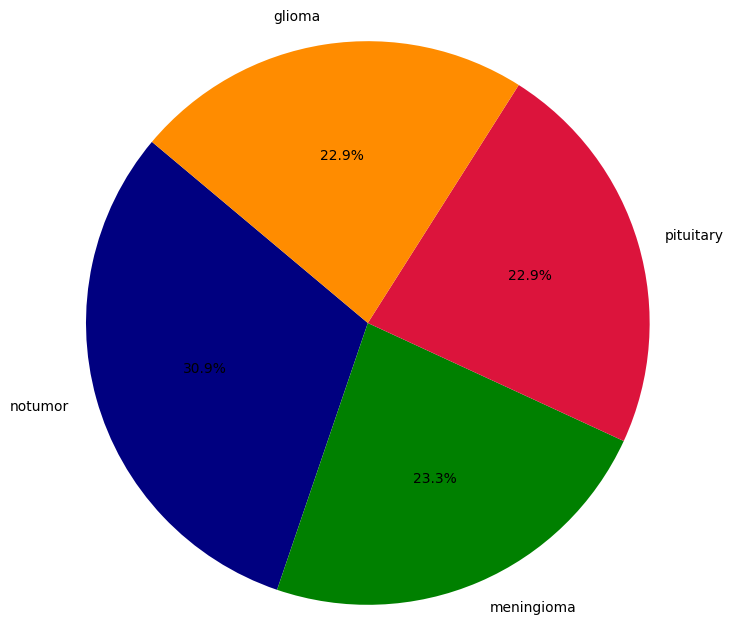

In [22]:
label_counts = test_df["label"].value_counts()

plt.figure(figsize=(8, 8))
color=["navy","green","crimson","darkorange"]
plt.pie(label_counts, labels=label_counts.index, autopct='%1.1f%%', startangle=140,colors=color)
plt.axis('equal')
plt.show()

In [23]:
filepath=[]
label=[]
image_folder=os.listdir(valid_data)
for folder in image_folder:
    folder_path=os.path.join(valid_data,folder)
    filelist=os.listdir(folder_path)
    for file in filelist:
        new_path=os.path.join(folder_path,file)
        filepath.append(new_path)
        label.append(folder)
        

image_data=pd.Series(filepath,name="image_data")
label_data=pd.Series(label,name="label")
valid_df=pd.concat([image_data,label_data],axis=1)
valid_df.head()
        

,image_data,label
0,/kaggle/input/brain-tumor-mri-dataset/Testing/...,pituitary
1,/kaggle/input/brain-tumor-mri-dataset/Testing/...,pituitary
2,/kaggle/input/brain-tumor-mri-dataset/Testing/...,pituitary
3,/kaggle/input/brain-tumor-mri-dataset/Testing/...,pituitary
4,/kaggle/input/brain-tumor-mri-dataset/Testing/...,pituitary


In [24]:
valid_df.shape

(1311, 2)

In [25]:
valid_df["label"].value_counts()

label
notumor       405
meningioma    306
pituitary     300
glioma        300
Name: count, dtype: int64

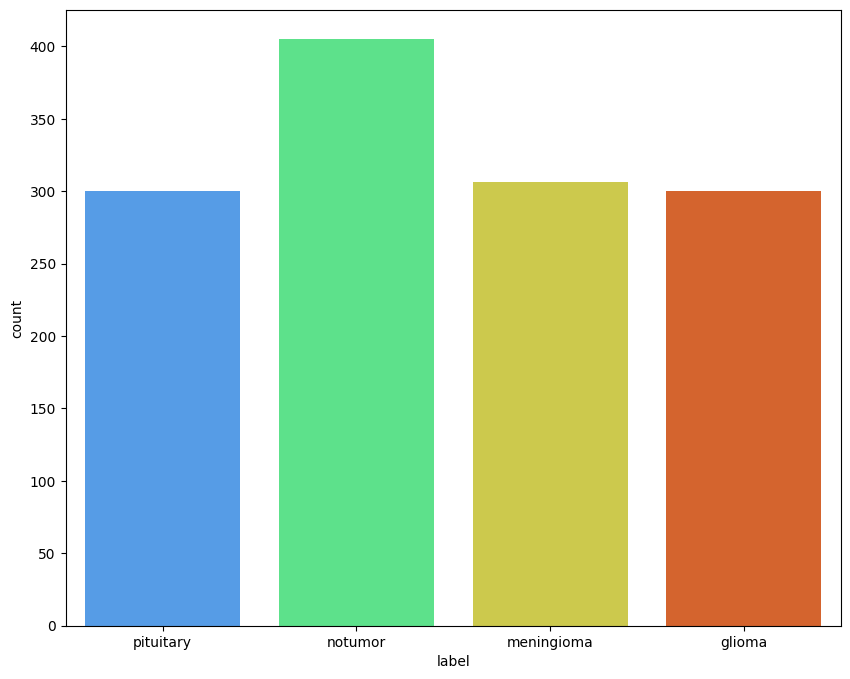

In [26]:
plt.figure(figsize=(10,8))
sns.countplot(data=valid_df,x="label",palette="turbo")
plt.show()

In [27]:
batch_size=16
color_channel=3
image_shape=(150,150,3)
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_generator = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')

test_generator=ImageDataGenerator(rescale=1./255)

train_data_generator=train_generator.flow_from_dataframe(train_df,x_col="image_data",y_col="label",
                                                        target_size=image_size,
                                                        color_mode="rgb",
                                                        shuffle=True,
                                                        batch_size=batch_size)

test_data_generator=test_generator.flow_from_dataframe(test_df,x_col="image_data",y_col="label",
                                                        target_size=image_size,
                                                        color_mode="rgb",
                                                        shuffle=False,
                                                        batch_size=batch_size)

valid_data_generator=test_generator.flow_from_dataframe(valid_df,x_col="image_data",y_col="label",
                                                        target_size=image_size,
                                                        color_mode="rgb",
                                                        shuffle=True,
                                                        batch_size=batch_size)

Found 5712 validated image filenames belonging to 4 classes.
Found 1311 validated image filenames belonging to 4 classes.
Found 1311 validated image filenames belonging to 4 classes.


In [28]:
import tensorflow as tf
from tensorflow.keras.applications import DenseNet169
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam


batch_size = 16
image_shape = (150, 150, 3)

# Function to create DenseNet-169 model
def create_densenet169_model(input_shape, num_classes):
    base_model = DenseNet169(weights='imagenet', include_top=False, input_shape=input_shape)
    
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    predictions = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=predictions)

    for layer in base_model.layers:
        layer.trainable = False

    return model

num_classes = len(train_data_generator.class_indices)


model = create_densenet169_model(image_shape, num_classes)


model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])


model.summary()


51877672/51877672 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 150, 150,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 156, 156,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 75, 75,    │      9,408 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 75, 75,    │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 75, 75,    │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 77, 77,    │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 38, 38,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 38, 38,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 38, 38,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 38, 38,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 38, 38,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 38, 38,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 38, 38,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 38, 38,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 38, 38,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 38, 38,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 38, 38,    │     12,288 │ conv2_block2_0_r

 Total params: 14,351,940 (54.75 MB)

 Trainable params: 1,709,060 (6.52 MB)

 Non-trainable params: 12,642,880 (48.23 MB)

In [29]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=10, min_lr=1e-6)


history = model.fit(train_data_generator,validation_data=valid_data_generator,epochs=50,
    callbacks=[early_stopping, reduce_lr])


Epoch 1/50


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


  1/357 ━━━━━━━━━━━━━━━━━━━━ 3:59:25 40s/step - accuracy: 0.3125 - loss: 1.6546

I0000 00:00:1719507864.592861     134 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1719507864.678139     134 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


356/357 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step - accuracy: 0.7460 - loss: 0.8103

W0000 00:00:1719507940.366057     134 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


357/357 ━━━━━━━━━━━━━━━━━━━━ 142s 285ms/step - accuracy: 0.7464 - loss: 0.8087 - val_accuracy: 0.8444 - val_loss: 0.4587 - learning_rate: 0.0010
Epoch 2/50
357/357 ━━━━━━━━━━━━━━━━━━━━ 43s 118ms/step - accuracy: 0.8726 - loss: 0.3383 - val_accuracy: 0.8802 - val_loss: 0.3133 - learning_rate: 0.0010
Epoch 3/50
357/357 ━━━━━━━━━━━━━━━━━━━━ 42s 116ms/step - accuracy: 0.8874 - loss: 0.2823 - val_accuracy: 0.8696 - val_loss: 0.3341 - learning_rate: 0.0010
Epoch 4/50
357/357 ━━━━━━━━━━━━━━━━━━━━ 42s 116ms/step - accuracy: 0.9129 - loss: 0.2460 - val_accuracy: 0.8917 - val_loss: 0.3053 - learning_rate: 0.0010
Epoch 5/50
357/357 ━━━━━━━━━━━━━━━━━━━━ 42s 117ms/step - accuracy: 0.9103 - loss: 0.2362 - val_accuracy: 0.9077 - val_loss: 0.2552 - learning_rate: 0.0010
Epoch 6/50
357/357 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - accuracy: 0.9233 - loss: 0.2102 - val_accuracy: 0.8772 - val_loss: 0.3111 - learning_rate: 0.0010
Epoch 7/50
357/357 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - accuracy: 0.9284 - loss

# Model Loss Graph

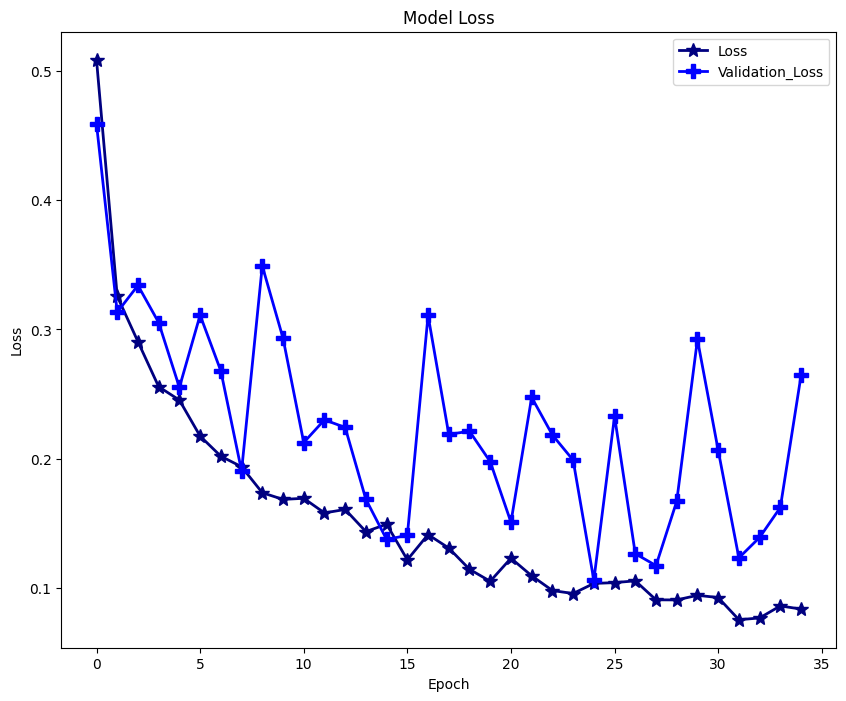

In [30]:
plt.figure(figsize=(10,8))
plt.plot(history.history['loss'],lw=2,marker="*",markersize=10,color="navy",label="Loss")
plt.plot(history.history['val_loss'],lw=2,marker="P",markersize=10,color="blue",label="Validation_Loss")
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc="best")
plt.show()

# Model Accuracy Graph

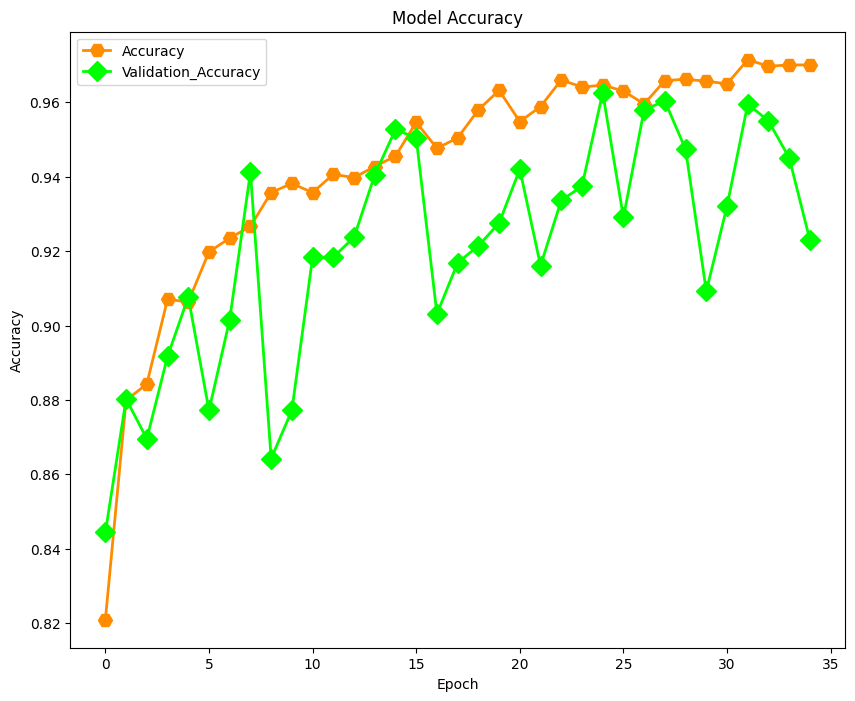

In [31]:
plt.figure(figsize=(10,8))
plt.plot(history.history['accuracy'],lw=2,marker="H",markersize=10,color="darkorange",label="Accuracy")
plt.plot(history.history['val_accuracy'],lw=2,marker="D",markersize=10,color="lime",label="Validation_Accuracy")
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc="best")
plt.show()

In [32]:
# Save the entire model to a HDF5 file
model.save('brain_tumor_classifier.h5')


In [33]:
test_loss, test_accuracy = model.evaluate(test_data_generator)
print(f'Test Loss: {test_loss:.4f}')
print(f'Test Accuracy: {test_accuracy:.4f}')


82/82 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - accuracy: 0.9820 - loss: 0.0529
Test Loss: 0.1063
Test Accuracy: 0.9626


In [34]:
test_data_generator.class_indices


{'glioma': 0, 'meningioma': 1, 'notumor': 2, 'pituitary': 3}

In [35]:
label_name=["glioma","meningioma","notumor","pituitary"]

In [36]:
pred=model.predict(test_data_generator)
final=np.argmax(pred,axis=1)

 5/82 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step

W0000 00:00:1719509464.048405     134 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


82/82 ━━━━━━━━━━━━━━━━━━━━ 31s 206ms/step


# confusion matrix

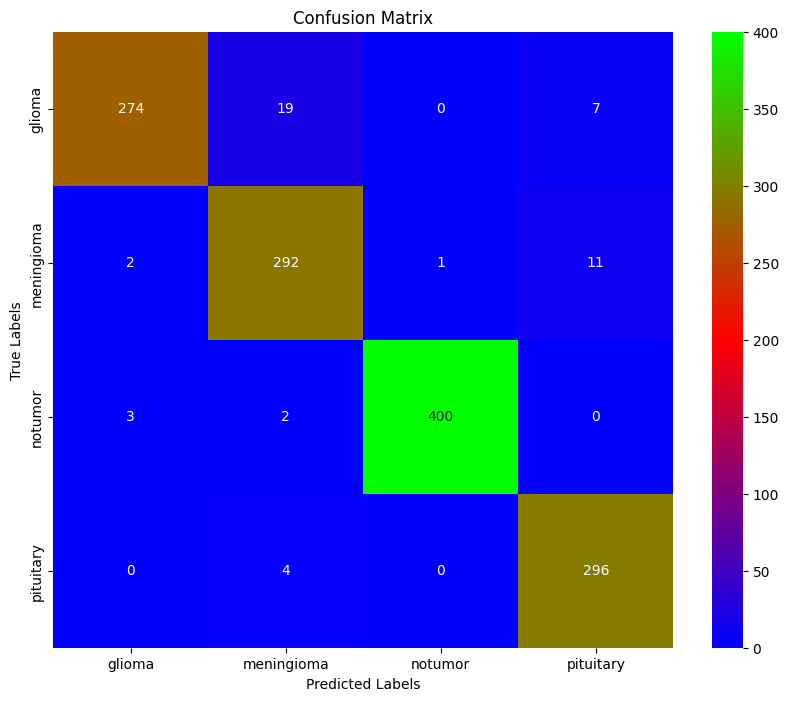

In [37]:
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, roc_auc_score
from sklearn.metrics import log_loss, cohen_kappa_score, matthews_corrcoef, brier_score_loss,accuracy_score

true_data=test_data_generator.classes
cf=confusion_matrix(test_data_generator.classes,final)
plt.figure(figsize=(10,8))

sns.heatmap(cf, annot=True, cmap='brg', fmt='g',xticklabels=label_name,yticklabels=label_name)

plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')

plt.show()

# classification report

In [38]:
print(classification_report(true_data,final,target_names=label_name))

              precision    recall  f1-score   support

      glioma       0.98      0.91      0.95       300
  meningioma       0.92      0.95      0.94       306
     notumor       1.00      0.99      0.99       405
   pituitary       0.94      0.99      0.96       300

    accuracy                           0.96      1311
   macro avg       0.96      0.96      0.96      1311
weighted avg       0.96      0.96      0.96      1311



# roc curve

82/82 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step


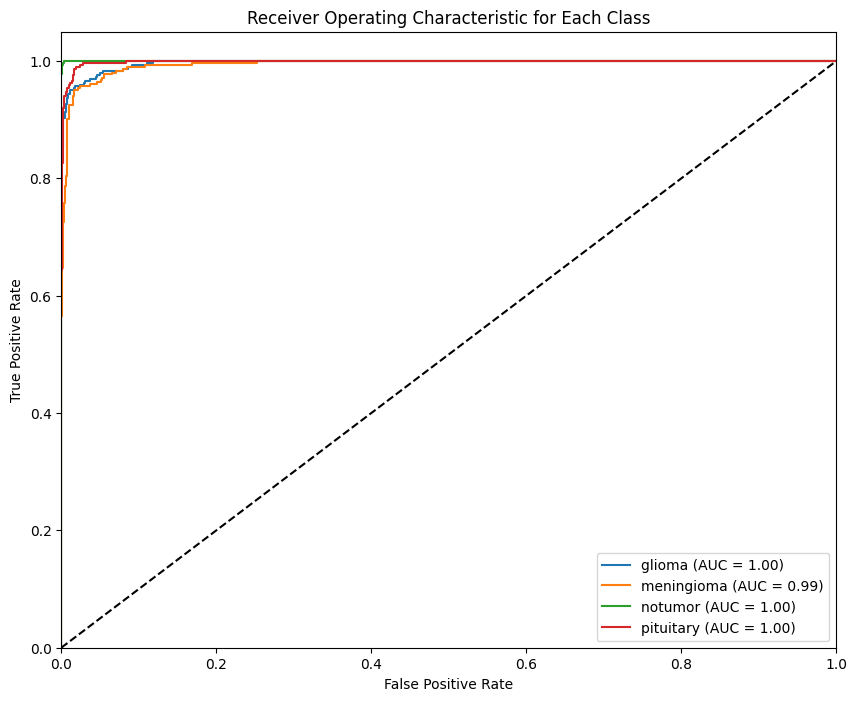

In [39]:


y_true = test_data_generator.classes


y_pred_prob = model.predict(test_data_generator)  

classes = {'glioma': 0, 'meningioma': 1, 'notumor': 2, 'pituitary': 3}
y_true_binarized = label_binarize(y_true, classes=range(len(classes)))

fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(len(classes)):
    fpr[i], tpr[i], _ = roc_curve(y_true_binarized[:, i], y_pred_prob[:, i])
    roc_auc[i] = roc_auc_score(y_true_binarized[:, i], y_pred_prob[:, i])

plt.figure(figsize=(10, 8))
for i, label in enumerate(classes.keys()):
    plt.plot(fpr[i], tpr[i], label=f'{label} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for Each Class')
plt.legend(loc='lower right')
plt.show()


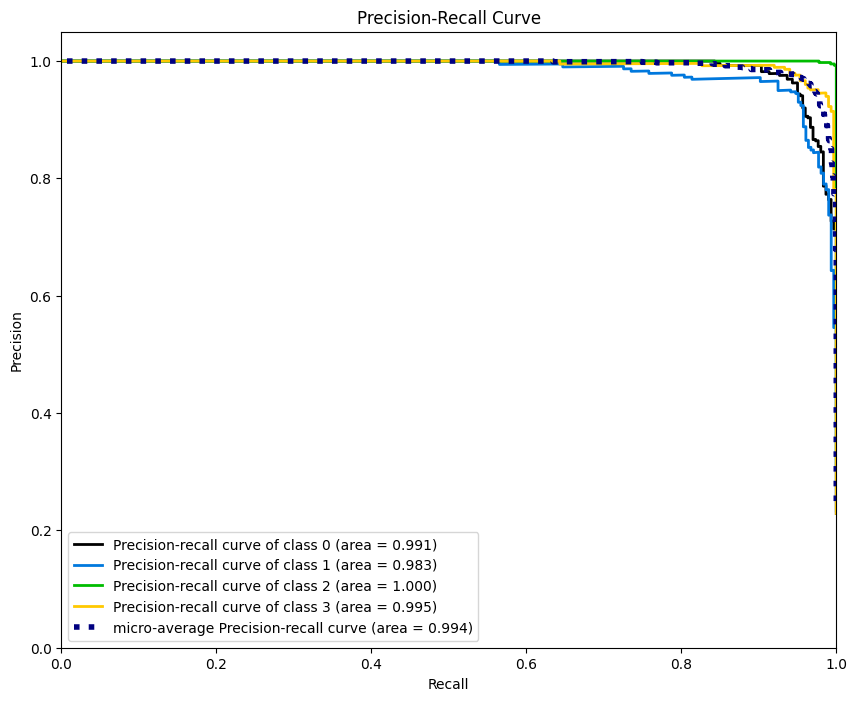

In [40]:
import scikitplot as skplt
skplt.metrics.plot_precision_recall(y_true, y_pred_prob,figsize=(10,8))
plt.show()

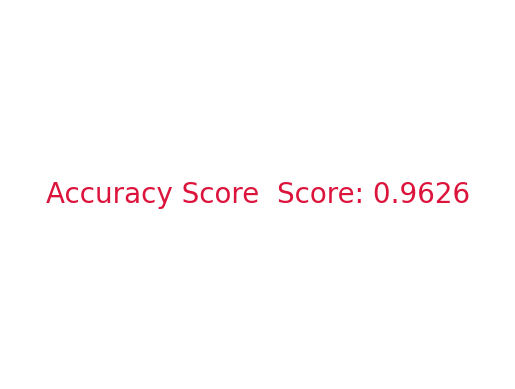

In [41]:
acc_score = accuracy_score(y_true,final)
plt.plot([])
plt.text(0,0, f'Accuracy Score  Score: {acc_score:.4f}', fontsize=20, ha='center', va='center',color="crimson")
plt.axis('off')
plt.xlim(-1, 1)
plt.ylim(-1,1)

plt.show()

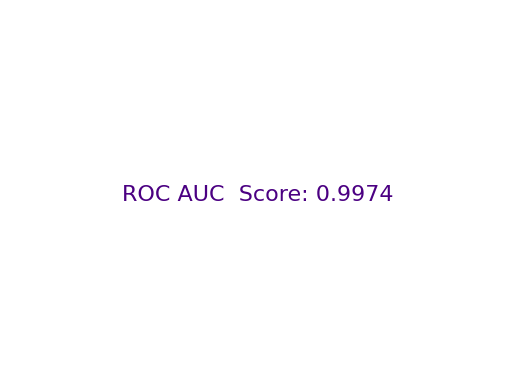

In [42]:
roc_auc = roc_auc_score(y_true, pred,multi_class='ovr')
plt.plot([])
plt.text(0,0, f'ROC AUC  Score: {roc_auc:.4f}', fontsize=16, ha='center', va='center',color="indigo")
plt.axis('off')
plt.xlim(-1, 1)
plt.ylim(-1,1)

plt.show()

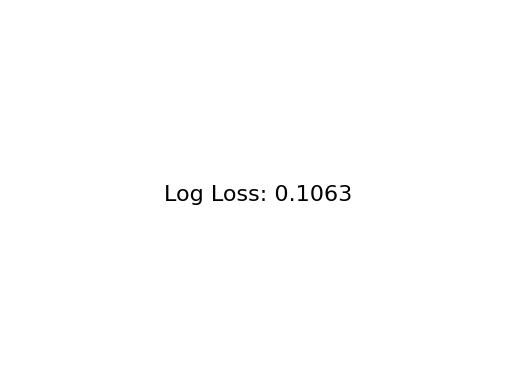

In [43]:
logarithm_loss=log_loss(y_true,pred)
plt.plot([])
plt.text(0,0, f'Log Loss: {logarithm_loss:.4f}', fontsize=16, ha='center', va='center',color="black")
plt.axis('off')
plt.xlim(-1, 1)
plt.ylim(-1,1)

plt.show()

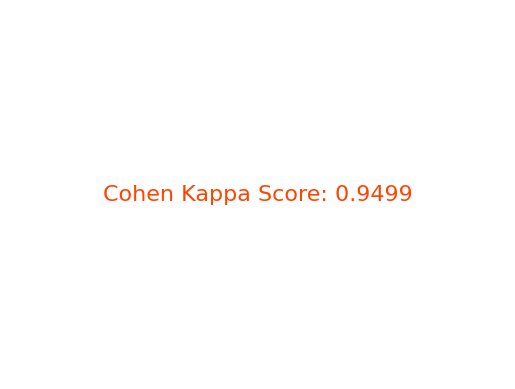

In [44]:
kappa = cohen_kappa_score(y_true,final)
plt.plot([])
plt.text(0,0, f'Cohen Kappa Score: {kappa:.4f}', fontsize=16, ha='center', va='center',color="orangered")
plt.axis('off')

plt.xlim(-1, 1)
plt.ylim(-1,1)

plt.show()

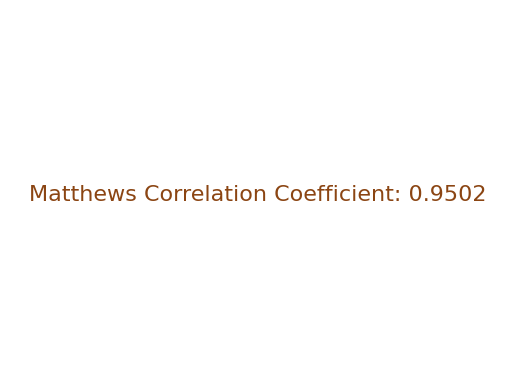

In [45]:
mcc = matthews_corrcoef(y_true, final)
plt.plot([])
plt.text(0,0, f'Matthews Correlation Coefficient: {mcc:.4f}', fontsize=16, ha='center', va='center',color="saddlebrown")
plt.axis('off')

plt.xlim(-1, 1)
plt.ylim(-1,1)

plt.show()

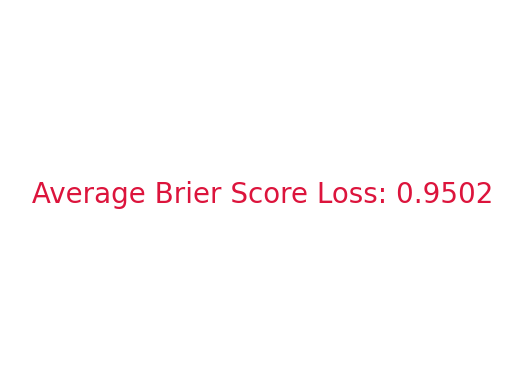

In [46]:
num_classes=4

true_data_one_hot = np.eye(num_classes)[true_data]
brier_scores = []
for i in range(num_classes):
    brier_scores.append(brier_score_loss(true_data_one_hot[:, i], pred[:, i]))


average_brier_score = np.mean(brier_scores)


plt.plot([])
plt.text(0,0, f' Average Brier Score Loss: {mcc:.4f}', fontsize=20, ha='center', va='center',color="crimson")
plt.axis('off')
plt.xlim(-1, 1)
plt.ylim(-1,1)

plt.show()

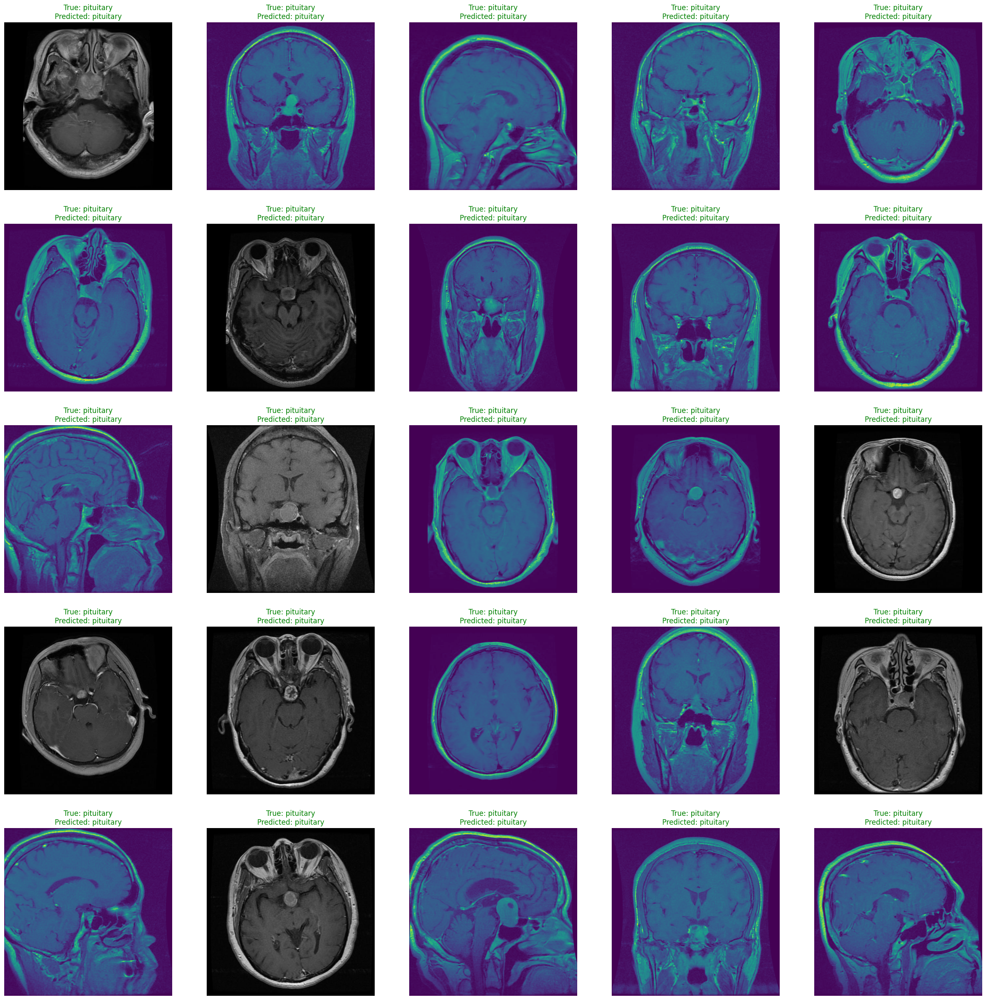

In [47]:
class_name = list(test_data_generator.class_indices.keys())

plt.figure(figsize=(30,30))
number_images=(5,5)
for i in range(1,(number_images[0]*number_images[1])+1):
    plt.subplot(number_images[0],number_images[1],i)
    plt.axis("off")
    
    true_label = class_name[test_data_generator.classes[i]]
    predicted_label = class_name[final[i]]
    
    color="green"
    if true_label != predicted_label:
        color="red"
    
    plt.title(f"True: {true_label}\nPredicted: {predicted_label}", color=color)
    plt.imshow(plt.imread(test_data_generator.filepaths[i]))
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 19s 19s/step
Predicted class: notumor
Probability: 1.0


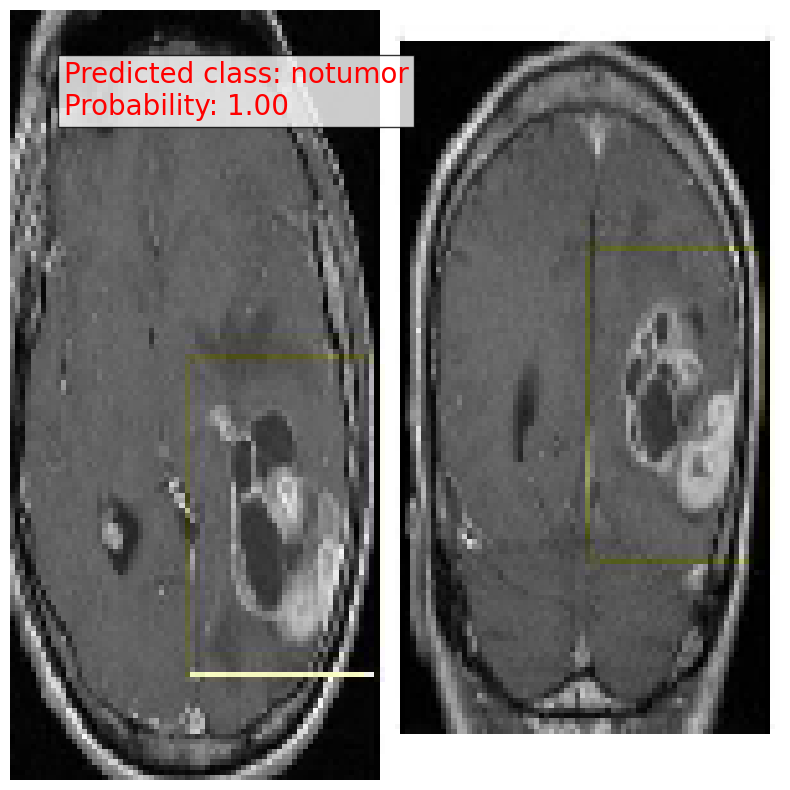

In [48]:
import os
import urllib.request
import numpy as np
from keras.preprocessing import image
import matplotlib.pyplot as plt

label_name = ["glioma", "meningioma", "notumor", "pituitary"]

img_url = "https://www.aboutcancer.com/gbm_cystic.jpg"

filename, headers = urllib.request.urlretrieve(img_url)
img_path = os.path.join(os.getcwd(), filename)

img = image.load_img(img_path, target_size=(150, 150))
img = image.img_to_array(img)
img = np.expand_dims(img, axis=0)

probs = model.predict(img)[0]

pred_class_prob = np.argmax(probs)
pred_class_name = label_name[pred_class_prob]

print(f'Predicted class: {pred_class_name}')
print(f'Probability: {probs[pred_class_prob]}')

plt.figure(figsize=(10, 10))
plt.imshow(img[0] / 255.)
plt.axis('off')
plt.text(10, 20, f'Predicted class: {pred_class_name}\nProbability: {probs[pred_class_prob]:.2f}', fontsize=20, color='red', bbox=dict(facecolor='white', alpha=0.8))
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Predicted class: notumor
Probability: 1.0


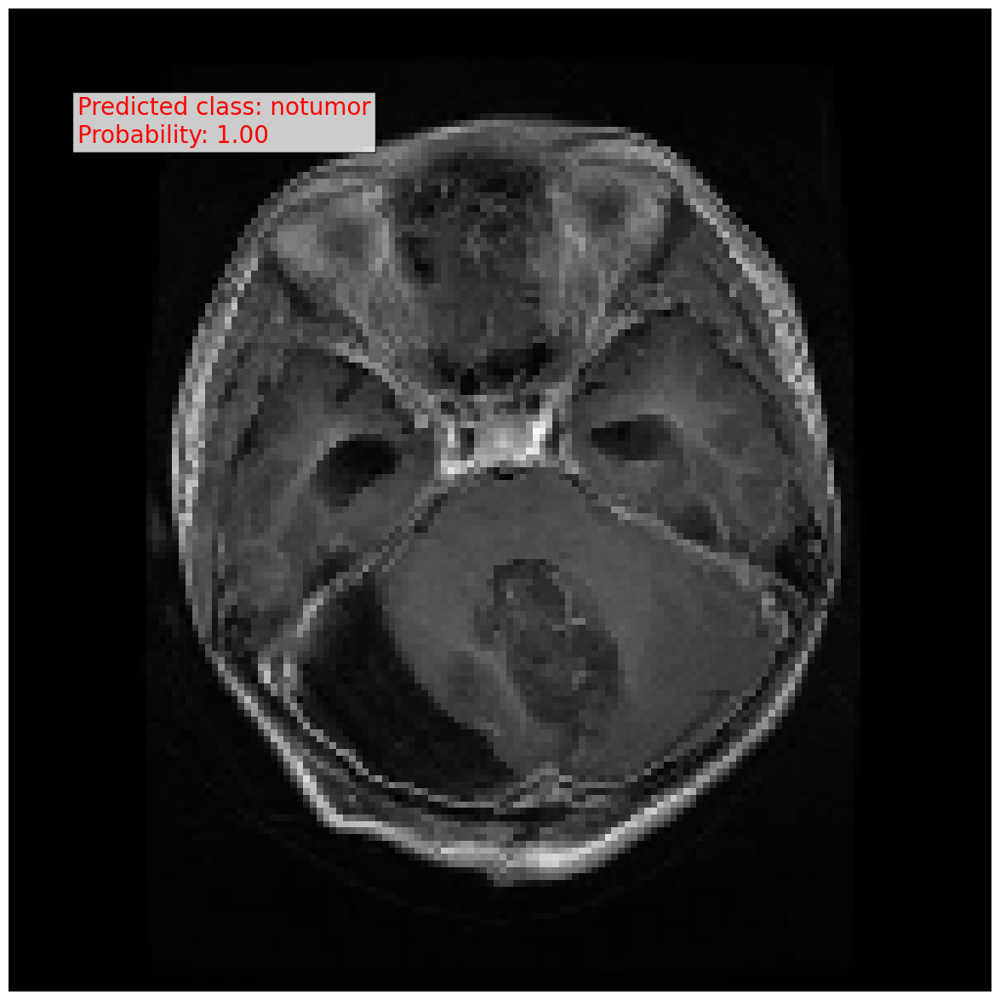

In [49]:
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
from PIL import Image
import io

plt.figure(figsize=(15, 15))

img_path = '/kaggle/input/brain-tumor-mri-dataset/Testing/glioma/Te-glTr_0000.jpg'
img = image.load_img(img_path, target_size=(150,150))
img = image.img_to_array(img)
img = np.expand_dims(img, axis=0)

probs = model.predict(img)[0]

pred_class_prob = np.argmax(probs)
class_indices = {0: 'glioma', 1: 'meningioma', 2: 'notumor', 3: 'pituitary'}
pred_class_name = class_indices[pred_class_prob]

print(f'Predicted class: {pred_class_name}')
print(f'Probability: {probs[pred_class_prob]}')

plt.imshow(img[0] / 255.)
plt.axis('off')
plt.text(10, 20, f'Predicted class: {pred_class_name}\nProbability: {probs[pred_class_prob]:.2f}', fontsize=20, color='red', bbox=dict(facecolor='white', alpha=0.8))
plt.show()


In [50]:

from PIL import Image
import io
import ipywidgets as widgets
from IPython.display import display, clear_output

# Function to convert RGBA image to RGB
def rgba_to_rgb(image):
    if image.mode == 'RGBA':
        image.load()  # required for png.split()
        background = Image.new("RGB", image.size, (255, 255, 255))
        background.paste(image, mask=image.split()[3])  # 3 is the alpha channel
        return background
    else:
        return image

# Function to predict the class of the uploaded MRI image and generate medical report
def image_prediction(uploaded_file):
    # Load image from bytes and preprocess
    image = Image.open(io.BytesIO(uploaded_file))
    
    # Convert RGBA to RGB if necessary
    image = rgba_to_rgb(image)
    
    image = image.resize((150, 150))  # Resize to match model input shape
    image_array = np.array(image) / 255.0
    image_array = np.expand_dims(image_array, axis=0)  # Add batch dimension

    # Perform prediction
    pred = model.predict(image_array)
    predicted_class_index = np.argmax(pred, axis=1)[0]
    
    # Map index to class name
    class_indices = {0: 'glioma', 1: 'meningioma', 2: 'notumor', 3: 'pituitary'}
    predicted_class = class_indices[predicted_class_index]
    
    # Generate medical report based on predicted class
    medical_report = generate_medical_report(predicted_class)
    
    # Display results
    print(f"Predicted Class: {predicted_class}")
    print(f"\nMedical Report:\n{medical_report}")

# Function to generate medical report based on predicted class
def generate_medical_report(predicted_class):
    # Define medical reports for each class (customize as per your model's predictions)
    if predicted_class == 'glioma':
        medical_condition = "You have a glioma located in the frontal lobe."
        medication_recommendations = "Chemotherapy drugs and steroids may be prescribed."
        treatment_guidance = "Surgery or radiation therapy may be recommended depending on the tumor size and location."
        lifestyle_changes = "Consider making lifestyle changes such as a healthy diet and regular exercise."
        specialist_referrals = "It's advisable to consult with a neurologist or oncologist for further evaluation and treatment."
    elif predicted_class == 'meningioma':
        medical_condition = "You have a meningioma, a usually benign tumor that arises from the meninges."
        medication_recommendations = "Observation or surgery may be recommended depending on the size and symptoms."
        treatment_guidance = "Surgical removal is often curative for symptomatic meningiomas."
        lifestyle_changes = "Monitor for any changes in symptoms and consult with a neurologist or neurosurgeon."
        specialist_referrals = "Consult with a neurosurgeon for further evaluation and treatment planning."
    elif predicted_class == 'pituitary':
        medical_condition = "You have a pituitary adenoma, a benign tumor that arises from the pituitary gland."
        medication_recommendations = "Observation, medication, or surgery may be recommended based on hormone levels and symptoms."
        treatment_guidance = "Treatment options include medications to control hormone secretion or surgical removal."
        lifestyle_changes = "Monitor for any changes in vision, hormone levels, or symptoms and maintain regular check-ups."
        specialist_referrals = "Consult with an endocrinologist or neurosurgeon for further evaluation and treatment."
    elif predicted_class == 'notumor':
        medical_condition = "No tumor detected in the brain."
        medication_recommendations = "No specific medications are recommended."
        treatment_guidance = "Regular monitoring of brain health and lifestyle modifications may be suggested."
        lifestyle_changes = "Maintain a healthy lifestyle with regular check-ups."
        specialist_referrals = "Consult with a neurologist for further advice on brain health."
    else:
        medical_condition = "Unknown condition."
        medication_recommendations = "Please consult with a healthcare professional."
        treatment_guidance = "Further evaluation is recommended."
        lifestyle_changes = "Follow medical advice."
        specialist_referrals = "Seek specialized medical care as needed."
    
    # Construct and return the medical report
    medical_report = f"{medical_condition}\n\n{medication_recommendations}\n\n{treatment_guidance}\n\n{lifestyle_changes}\n\n{specialist_referrals}"
    return medical_report

# Create file uploader and prediction button
uploader = widgets.FileUpload()
button = widgets.Button(description="Predict")
output = widgets.Output()

# Callback function for button click event
def button_click(_):
    with output:
        clear_output()
        try:
            # Get uploaded image
            uploaded_filename = next(iter(uploader.value))
            uploaded_file = uploader.value[uploaded_filename]['content']
            
            # Perform prediction
            image_prediction(uploaded_file)
        except Exception as e:
            print(f"Error: {str(e)}")

# Attach callback function to button click event
button.on_click(button_click)

# Display widgets
display(uploader)
display(button)
display(output)


FileUpload(value={}, description='Upload')

Button(description='Predict', style=ButtonStyle())

Output()